<a href="https://colab.research.google.com/github/Bassam-Alswehry/temporal-analysis-of-urban-areas-using-computer-vision-part2/blob/main/temporal_analysis_of_urban_areas_part2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 2 — Visual Explanation (Overlay + HUD)

## Goal
Turn Part 1 outputs into **human-readable visual explanations**:
- WHERE did change happen?
- Provide **overlay heatmap + Detroit-style HUD**
- Save outputs for GitHub / LinkedIn / Part 3/4/5

## Inputs
- data/images/*.jpg (or .png)

## Outputs
- data/output/* (composite images + overlays)


In [ ]:
!pip -q install opencv-python-headless scikit-image pandas

import os
import re
import cv2
import numpy as np
import pandas as pd

from pathlib import Path
from skimage.metrics import structural_similarity as ssim

print("OpenCV:", cv2.__version__)

OpenCV: 4.13.0


In [ ]:
# Paths
IMAGES_DIR = Path("data/images")
OUT_DIR    = Path("data/output")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# Optional:
CSV_PATH = Path("data/results.csv")

# Settings
ECC_ITERS = 80
ECC_EPS   = 1e-6

HEAT_ALPHA = 0.45   # overlay strength
HUD_ALPHA  = 0.55   # HUD transparency

print("Images dir:", IMAGES_DIR)
print("Output dir:", OUT_DIR)
print("CSV exists?:", CSV_PATH.exists())

Images dir: data/images
Output dir: data/output
CSV exists?: False


In [ ]:
def list_images(images_dir: Path):
    exts = {".jpg", ".jpeg", ".png", ".webp"}
    files = [p for p in images_dir.iterdir() if p.suffix.lower() in exts]
    files.sort()
    return files

pattern = re.compile(r"barcelona_(?P<area>[a-zA-Z]+)(?P<loc>\d+?)_(?P<year>\d{4})")

def parse_name(file_path: Path):
    m = pattern.search(file_path.stem)
    if not m:
        return None
    area = m.group("area").lower()
    loc  = m.group("loc")
    year = int(m.group("year"))
    return area, loc, year

files = list_images(IMAGES_DIR)
print("Found files:", len(files))
for f in files:
    print(f.name)

Found files: 6
barcelona_coastal01_2014.png
barcelona_coastal01_2024.png
barcelona_dense02_2014.png
barcelona_dense02_2022.png
barcelona_stable03_2014.png
barcelona_stable03_2022.png


In [ ]:
from collections import defaultdict

groups = defaultdict(list)

for f in files:
    parsed = parse_name(f)
    if parsed is None:
        continue
    area, loc, year = parsed
    key = (area, loc)
    groups[key].append((year, f))

pairs = []
for (area, loc), items in groups.items():
    items.sort(key=lambda x: x[0])
    if len(items) < 2:
        continue
    y1, f1 = items[0]      # first year
    y2, f2 = items[-1]     # last year
    pairs.append((area, loc, y1, f1, y2, f2))

pairs.sort(key=lambda x: (x[0], x[1]))

print("Pairs detected:", len(pairs))
for p in pairs:
    area, loc, y1, f1, y2, f2 = p
    print(f"{area}{loc}: {y1} -> {y2} | {f1.name} vs {f2.name}")

Pairs detected: 3
coastal01: 2014 -> 2024 | barcelona_coastal01_2014.png vs barcelona_coastal01_2024.png
dense02: 2014 -> 2022 | barcelona_dense02_2014.png vs barcelona_dense02_2022.png
stable03: 2014 -> 2022 | barcelona_stable03_2014.png vs barcelona_stable03_2022.png


In [ ]:
df_part1 = None
if CSV_PATH.exists():
    df_part1 = pd.read_csv(CSV_PATH)
    print("CSV loaded:", df_part1.shape)
    display(df_part1.head(3))
else:
    print("No results.csv found. We'll compute display scores inside Part 2 (fallback).")

No results.csv found. We'll compute display scores inside Part 2 (fallback).


In [ ]:
def read_bgr(path: Path):
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        raise FileNotFoundError(f"Failed to read: {path}")
    return img

def center_crop_same(a, b):
    h = min(a.shape[0], b.shape[0])
    w = min(a.shape[1], b.shape[1])
    def crop(img):
        y0 = (img.shape[0] - h)//2
        x0 = (img.shape[1] - w)//2
        return img[y0:y0+h, x0:x0+w]
    return crop(a), crop(b)

def align_ecc(base_bgr, target_bgr):
    # Align target -> base using ECC (homography)
    base_g = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2GRAY)
    tgt_g  = cv2.cvtColor(target_bgr, cv2.COLOR_BGR2GRAY)

    base_g = cv2.GaussianBlur(base_g, (5,5), 0)
    tgt_g  = cv2.GaussianBlur(tgt_g,  (5,5), 0)

    warp = np.eye(3, dtype=np.float32)  # homography
    criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, ECC_ITERS, ECC_EPS)

    try:
        cc, warp = cv2.findTransformECC(base_g, tgt_g, warp, cv2.MOTION_HOMOGRAPHY, criteria, None, 1)
        aligned = cv2.warpPerspective(target_bgr, warp, (base_bgr.shape[1], base_bgr.shape[0]),
                                      flags=cv2.INTER_LINEAR + cv2.WARP_INVERSE_MAP,
                                      borderMode=cv2.BORDER_REPLICATE)
        return aligned, float(cc)
    except cv2.error:
        # if ECC fails, return original
        return target_bgr.copy(), 0.0

def compute_edges_change(base_bgr, cur_bgr):
    base_g = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2GRAY)
    cur_g  = cv2.cvtColor(cur_bgr,  cv2.COLOR_BGR2GRAY)

    e1 = cv2.Canny(base_g, 60, 160)
    e2 = cv2.Canny(cur_g,  60, 160)
    diff = cv2.absdiff(e1, e2)

    # Normalize score
    score = float(diff.mean()) / 255.0
    return diff, score

def compute_ssim_score(base_bgr, cur_bgr):
    base_g = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2GRAY)
    cur_g  = cv2.cvtColor(cur_bgr,  cv2.COLOR_BGR2GRAY)
    s, ssim_map = ssim(base_g, cur_g, full=True)
    # Convert to "change" (lower ssim => higher change)
    change = 1.0 - float(s)
    # SSIM map range ~ [-1,1], scale to 0..255 heat
    heat = (1.0 - ssim_map)
    heat = np.clip(heat, 0, 1)
    heat = (heat * 255).astype(np.uint8)
    return heat, change

def build_heatmap_overlay(base_bgr, cur_bgr):
    # Blend two sources: edges diff + ssim heat (simple but effective)
    edges_diff, edges_score = compute_edges_change(base_bgr, cur_bgr)
    ssim_heat,  ssim_change = compute_ssim_score(base_bgr, cur_bgr)

    # Combine (weights tuned for visuals)
    heat = cv2.addWeighted(edges_diff, 0.70, ssim_heat, 0.30, 0)
    heat = cv2.GaussianBlur(heat, (9,9), 0)

    heat_color = cv2.applyColorMap(heat, cv2.COLORMAP_TURBO)
    overlay = cv2.addWeighted(cur_bgr, 1.0 - HEAT_ALPHA, heat_color, HEAT_ALPHA, 0)

    # A single display score (not replacing Part 1; just for Part 2 fallback)
    display_score = 0.75*edges_score + 0.25*ssim_change

    return overlay, heat_color, display_score, edges_score, ssim_change

def decision_from_score(score):
    # Simple thresholds (display only)
    if score >= 0.55: return "HIGH"
    if score >= 0.35: return "MED"
    return "LOW"

def draw_hud(img_bgr, lines, title="STRUCTURAL MEMORY"):
    h, w = img_bgr.shape[:2]
    hud_w = int(w * 0.38)
    hud_h = int(h * 0.40)

    x0 = int(w * 0.58)
    y0 = int(h * 0.08)

    x1 = min(w-10, x0 + hud_w)
    y1 = min(h-10, y0 + hud_h)

    overlay = img_bgr.copy()
    cv2.rectangle(overlay, (x0, y0), (x1, y1), (25, 180, 220), 2)

    # filled translucent panel
    panel = overlay.copy()
    cv2.rectangle(panel, (x0, y0), (x1, y1), (8, 20, 30), -1)
    overlay = cv2.addWeighted(panel, HUD_ALPHA, overlay, 1 - HUD_ALPHA, 0)

    # Title
    cv2.putText(overlay, title, (x0+14, y0+34),
                cv2.FONT_HERSHEY_SIMPLEX, 0.75, (210, 240, 255), 2, cv2.LINE_AA)

    # Lines
    y = y0 + 70
    for k, v in lines:
        cv2.putText(overlay, f"{k}", (x0+14, y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, (180, 220, 255), 1, cv2.LINE_AA)
        cv2.putText(overlay, f"{v}", (x0+14, y+24),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.72, (255, 255, 255), 2, cv2.LINE_AA)
        y += 60

    return overlay

def stack_side_by_side(a, b, scale=0.60):
    # Resize for clean layout
    def resize(img):
        h, w = img.shape[:2]
        nh, nw = int(h*scale), int(w*scale)
        return cv2.resize(img, (nw, nh), interpolation=cv2.INTER_AREA)

    a2 = resize(a)
    b2 = resize(b)
    h = max(a2.shape[0], b2.shape[0])

    # pad to same height
    def pad(img):
        pad_h = h - img.shape[0]
        if pad_h <= 0: return img
        return cv2.copyMakeBorder(img, 0, pad_h, 0, 0, cv2.BORDER_CONSTANT, value=(0,0,0))

    a2 = pad(a2)
    b2 = pad(b2)
    return np.hstack([a2, b2])

In [ ]:
def get_part1_row(area, loc, y1, y2):
    # Flexible matching if CSV exists
    if df_part1 is None:
        return None

    # Try common columns
    cols = df_part1.columns.str.lower().tolist()
    df = df_part1.copy()
    df.columns = [c.lower() for c in df.columns]

    # Minimal matching strategies:
    # 1) area_type + location_id + baseline_year + current_year
    needed = {"area_type","location_id","baseline_year","current_year"}
    if needed.issubset(set(df.columns)):
        q = df[
            (df["area_type"].astype(str).str.lower() == str(area).lower()) &
            (df["location_id"].astype(str).str.contains(str(loc))) &
            (df["baseline_year"].astype(int) == int(y1)) &
            (df["current_year"].astype(int) == int(y2))
        ]
        if len(q) > 0:
            return q.iloc[0].to_dict()

    # 2) fallback none
    return None

def process_pair(area, loc, y1, f1, y2, f2):
    base = read_bgr(f1)
    cur  = read_bgr(f2)

    # Align + crop
    cur_aligned, ecc_cc = align_ecc(base, cur)
    base, cur_aligned = center_crop_same(base, cur_aligned)

    # Heat overlay
    overlay, heat_color, display_score, edges_score, ssim_change = build_heatmap_overlay(base, cur_aligned)

    # Part 1 CSV values (if available)
    row = get_part1_row(area, loc, y1, y2)

    if row:
        # try to read these keys if exist
        change_score = row.get("change_score", display_score)
        decision = row.get("decision", decision_from_score(float(change_score)))
        conf = row.get("confidence", None)
    else:
        change_score = display_score
        decision = decision_from_score(display_score)
        conf = None

    # HUD lines
    lines = [
        ("TEMPORAL CHANGE", str(decision)),
        ("BASELINE YEAR", str(y1)),
        ("CURRENT YEAR", str(y2)),
        ("CHANGE SCORE", f"{float(change_score):.3f}"),
        ("ECC ALIGN CC", f"{ecc_cc:.3f}"),
    ]
    if conf is not None:
        lines.append(("CONFIDENCE", f"{float(conf):.2f}"))

    # Create composites
    before_after = stack_side_by_side(base, cur_aligned, scale=0.55)
    overlay_hud  = draw_hud(overlay.copy(), lines)

    # Also include heatmap
    heat_hud = draw_hud(heat_color.copy(), [
        ("EDGES SCORE", f"{edges_score:.3f}"),
        ("SSIM CHANGE", f"{ssim_change:.3f}"),
        ("DISPLAY SCORE", f"{display_score:.3f}"),
    ], title="CHANGE MAP")

    # Save outputs
    tag = f"barcelona_{area}{loc}_{y1}_{y2}"
    out1 = OUT_DIR / f"{tag}_before_after.jpg"
    out2 = OUT_DIR / f"{tag}_overlay_hud.jpg"
    out3 = OUT_DIR / f"{tag}_heatmap_hud.jpg"

    cv2.imwrite(str(out1), before_after)
    cv2.imwrite(str(out2), overlay_hud)
    cv2.imwrite(str(out3), heat_hud)

    return str(out1), str(out2), str(out3)

print("Ready.")

Ready.


In [ ]:
saved = []
for area, loc, y1, f1, y2, f2 in pairs:
    print(f"Processing: {area}{loc}  {y1}->{y2}")
    outs = process_pair(area, loc, y1, f1, y2, f2)
    saved.append(outs)

print("\nSaved outputs:")
for outs in saved:
    for p in outs:
        print(p)

Processing: coastal01  2014->2024
Processing: dense02  2014->2022
Processing: stable03  2014->2022

Saved outputs:
data/output/barcelona_coastal01_2014_2024_before_after.jpg
data/output/barcelona_coastal01_2014_2024_overlay_hud.jpg
data/output/barcelona_coastal01_2014_2024_heatmap_hud.jpg
data/output/barcelona_dense02_2014_2022_before_after.jpg
data/output/barcelona_dense02_2014_2022_overlay_hud.jpg
data/output/barcelona_dense02_2014_2022_heatmap_hud.jpg
data/output/barcelona_stable03_2014_2022_before_after.jpg
data/output/barcelona_stable03_2014_2022_overlay_hud.jpg
data/output/barcelona_stable03_2014_2022_heatmap_hud.jpg


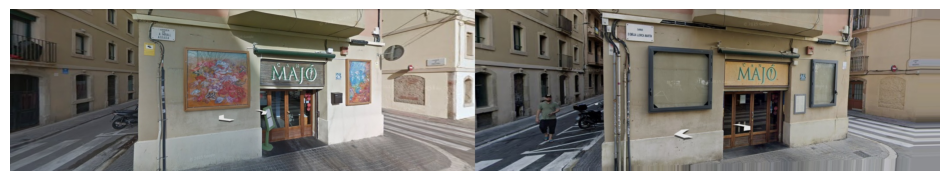

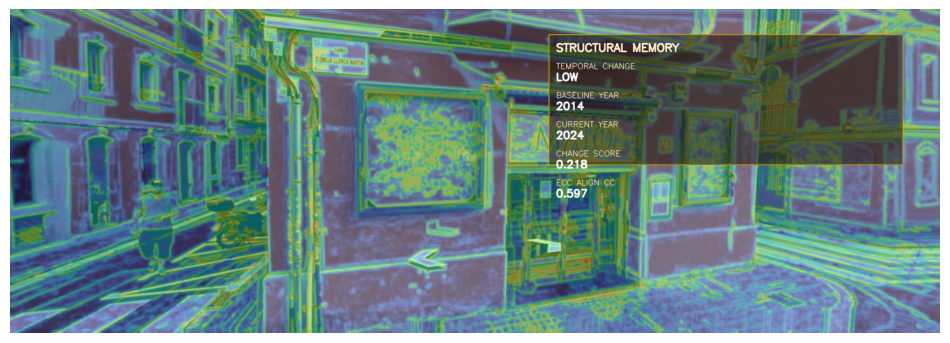

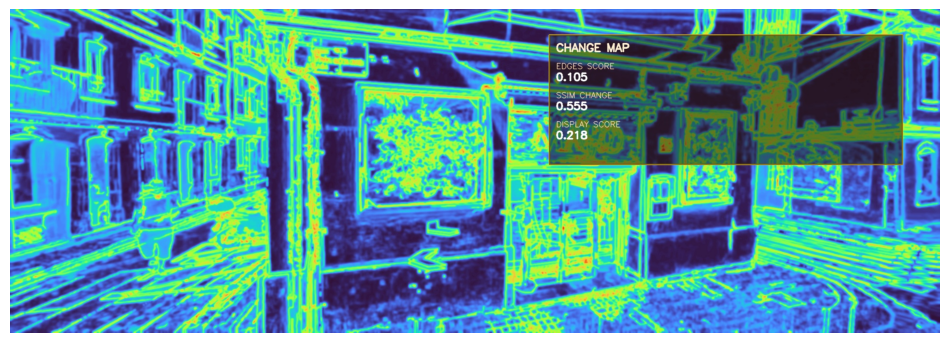

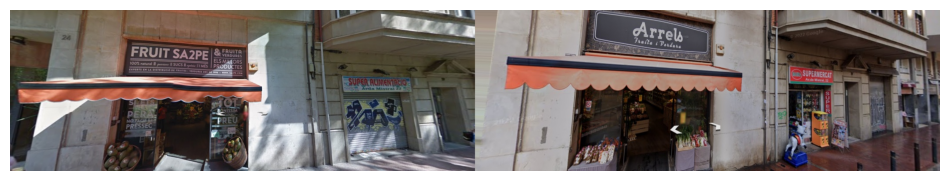

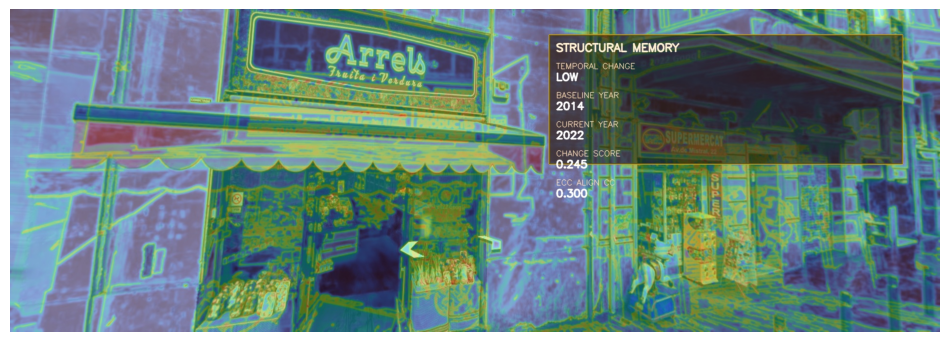

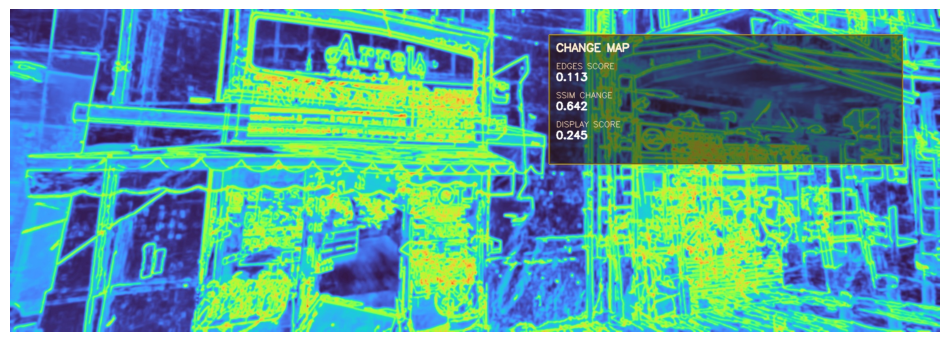

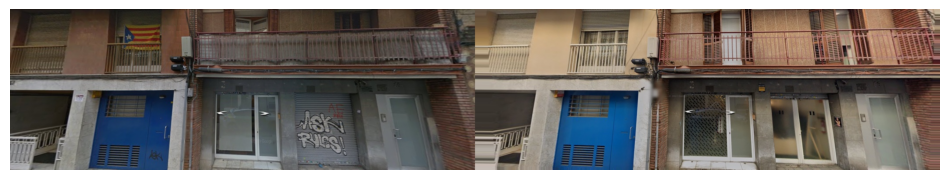

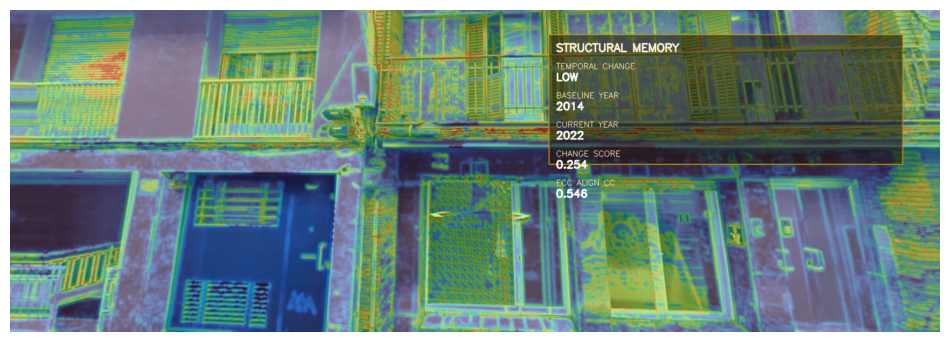

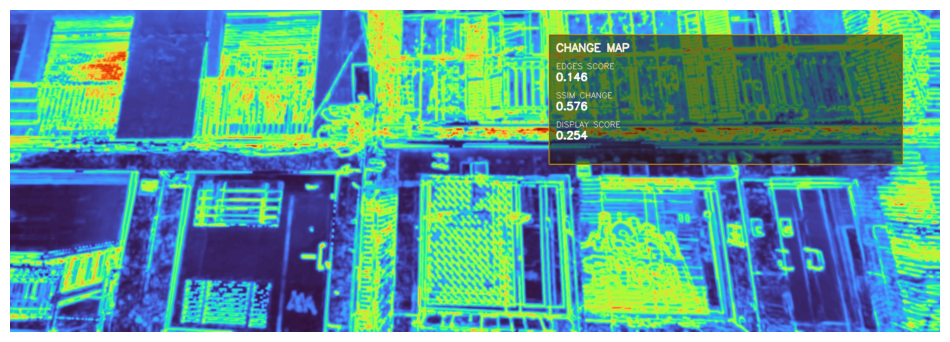

In [ ]:
from PIL import Image
from matplotlib import pyplot as plt

def show_image(path, size=(12,6)):
    img = Image.open(path)
    plt.figure(figsize=size)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# عرض مخرجات كل زوج
for outs in saved:
    show_image(outs[0], (12,5))  # before/after
    show_image(outs[1], (12,6))  # overlay hud
    show_image(outs[2], (12,6))  # heatmap hud

Saved VEX outputs:
data/output/barcelona_coastal01_2014_2024_before_after_vex.jpg
data/output/barcelona_coastal01_2014_2024_overlay_hud_vex.jpg
data/output/barcelona_coastal01_2014_2024_heatmap_hud_vex.jpg
data/output/barcelona_dense02_2014_2022_before_after_vex.jpg
data/output/barcelona_dense02_2014_2022_overlay_hud_vex.jpg
data/output/barcelona_dense02_2014_2022_heatmap_hud_vex.jpg
data/output/barcelona_stable03_2014_2022_before_after_vex.jpg
data/output/barcelona_stable03_2014_2022_overlay_hud_vex.jpg
data/output/barcelona_stable03_2014_2022_heatmap_hud_vex.jpg


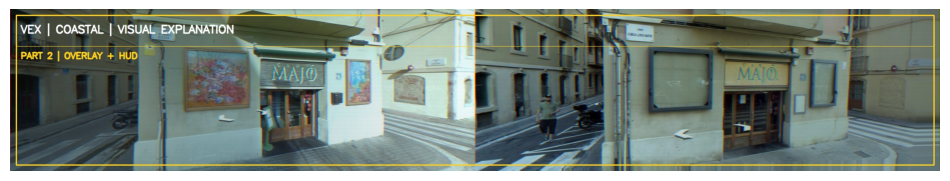

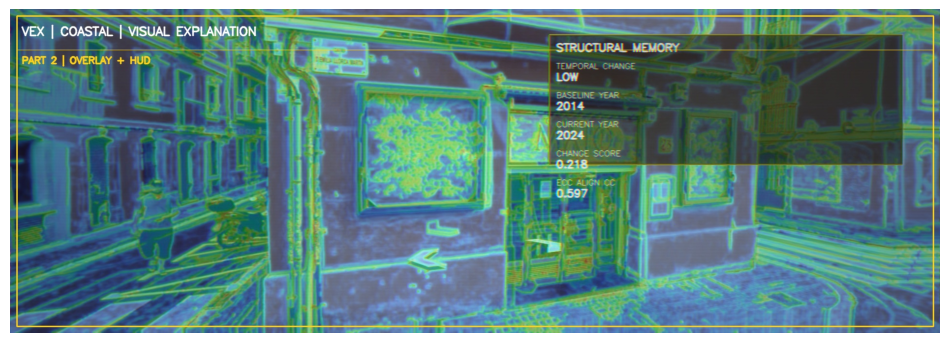

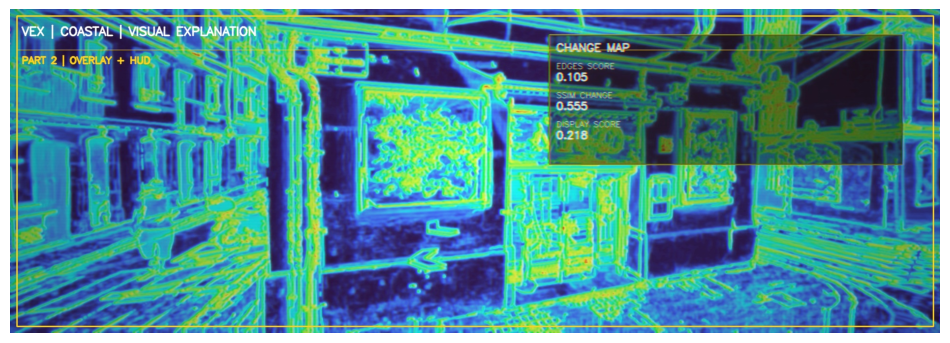

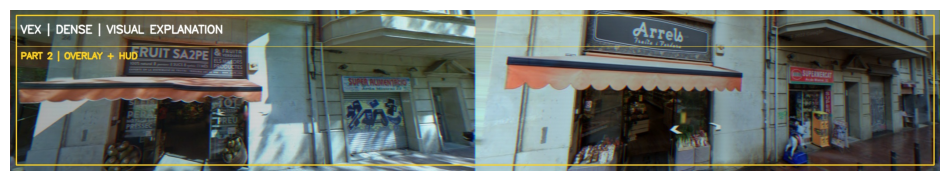

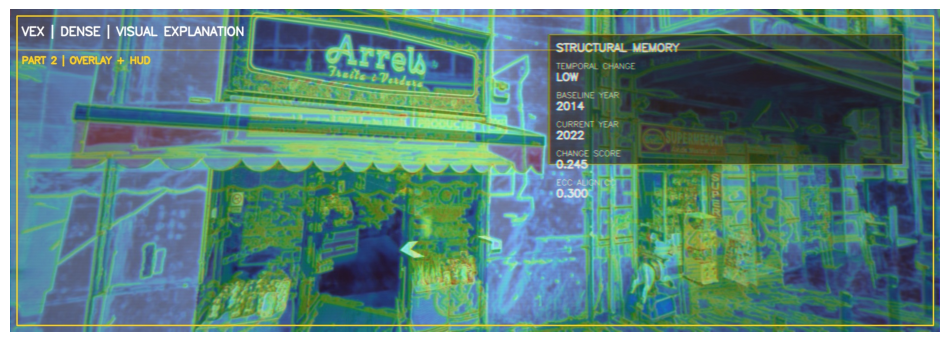

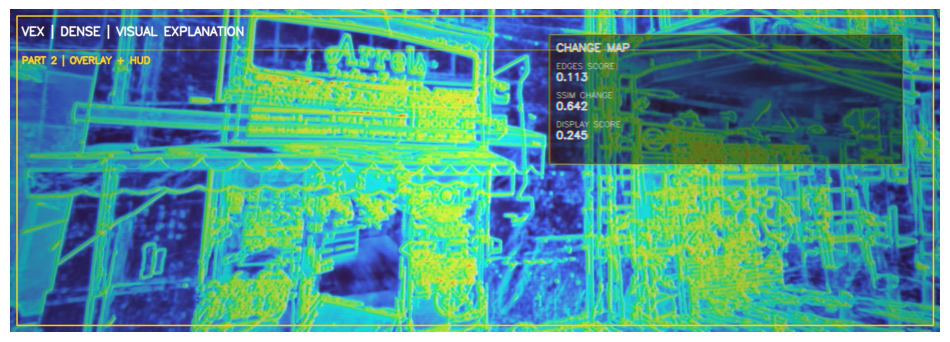

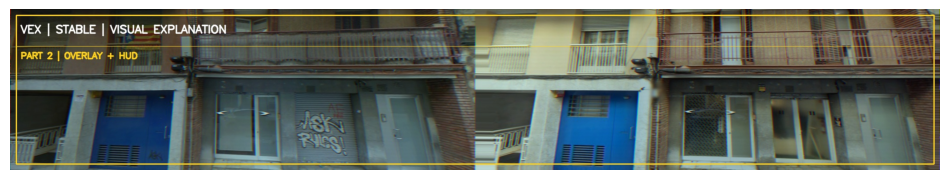

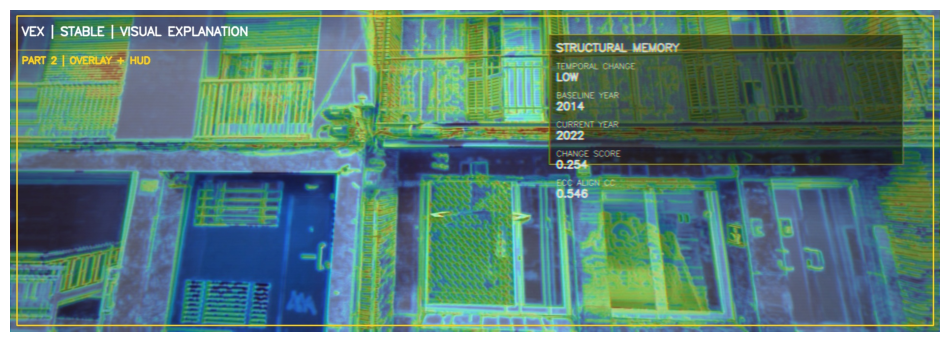

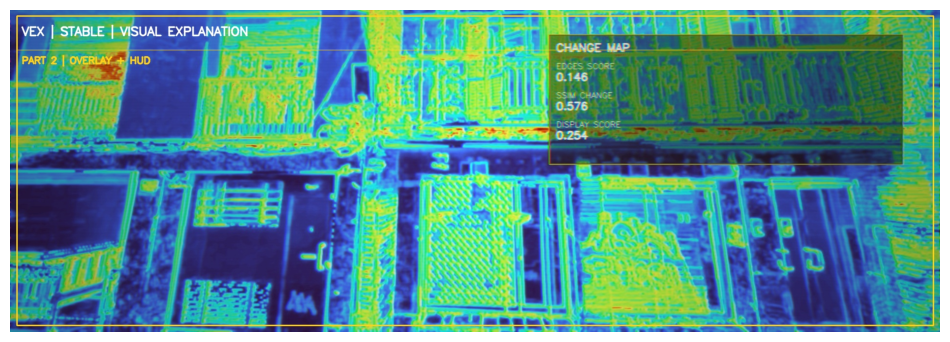

In [ ]:
# Cell 11 — VEX Style (Dynamic Area Title) + Save to data/output
from PIL import Image
import numpy as np
import cv2
from matplotlib import pyplot as plt
from pathlib import Path

VEX_DIR = Path("data/output")
VEX_DIR.mkdir(parents=True, exist_ok=True)

def vex_style(bgr, area_label=""):
    """
    VEX visual styling only (no impact on computed results):
    - teal/cyan grade
    - scanlines
    - subtle bloom
    - vignette
    - small glitch offset
    - HUD frame + dynamic title (area)
    """
    img = bgr.copy()
    h, w = img.shape[:2]

    # color grade (teal / cyan)
    b, g, r = cv2.split(img)
    b = cv2.addWeighted(b, 1.12, b, 0, 0)
    g = cv2.addWeighted(g, 1.10, g, 0, 0)
    r = cv2.addWeighted(r, 0.92, r, 0, 0)
    img = cv2.merge([b, g, r])

    # contrast
    img = cv2.convertScaleAbs(img, alpha=1.12, beta=0)

    # scanlines
    scan = img.copy()
    for y in range(0, h, 3):
        scan[y:y+1, :, :] = (scan[y:y+1, :, :] * 0.60).astype(np.uint8)
    img = cv2.addWeighted(img, 0.90, scan, 0.10, 0)

    # bloom (soft glow)
    blur = cv2.GaussianBlur(img, (0,0), sigmaX=6, sigmaY=6)
    img = cv2.addWeighted(img, 0.88, blur, 0.12, 0)

    # vignette
    yy, xx = np.mgrid[0:h, 0:w]
    cx, cy = w/2, h/2
    dist = np.sqrt((xx - cx)**2 + (yy - cy)**2)
    dist = dist / dist.max()
    vign = (1.0 - 0.35*dist).clip(0.65, 1.0)
    img = (img * vign[..., None]).astype(np.uint8)

    # tiny glitch (RGB channel shift)
    shift = 2
    B, G, R = cv2.split(img)
    R = np.roll(R, shift, axis=1)
    B = np.roll(B, -shift, axis=1)
    img = cv2.merge([B, G, R])

    # HUD frame + VEX title
    hud = img.copy()
    c = (25, 210, 255)  # cyan-like in BGR

    cv2.rectangle(hud, (14, 14), (w-14, h-14), c, 2)
    cv2.line(hud, (14, 84), (w-14, 84), c, 1)

    # Top header (dynamic)
    area_label = (area_label or "").strip().upper()
    header = f"VEX | {area_label} | VISUAL EXPLANATION" if area_label else "VEX | VISUAL EXPLANATION"

    cv2.putText(hud, header, (24, 54),
                cv2.FONT_HERSHEY_SIMPLEX, 0.82, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(hud, "PART 2 | OVERLAY + HUD", (24, 112),
                cv2.FONT_HERSHEY_SIMPLEX, 0.65, c, 2, cv2.LINE_AA)

    return hud

def read_as_bgr(path):
    img_rgb = np.array(Image.open(path).convert("RGB"))
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

def get_area_from_filename(stem: str):
    # expected: barcelona_{area}{loc}_{year}_{year}_...
    # examples: barcelona_coastal01_2014_2022_before_after
    s = stem.lower()
    if "barcelona_coastal" in s: return "COASTAL"
    if "barcelona_dense" in s:   return "DENSE"
    if "barcelona_stable" in s:  return "STABLE"
    return ""

def save_vex_version(src_path):
    src_path = Path(src_path)
    bgr = read_as_bgr(src_path)

    area_label = get_area_from_filename(src_path.stem)
    styled = vex_style(bgr, area_label=area_label)

    out_name = src_path.stem + "_vex.jpg"
    out_path = VEX_DIR / out_name

    cv2.imwrite(str(out_path), styled)
    return out_path

def show_image(path, size=(12,6)):
    img = Image.open(path)
    plt.figure(figsize=size)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# 1) Save VEX versions
vex_saved = []
for outs in saved:
    vex_group = []
    for p in outs:
        vex_group.append(save_vex_version(p))
    vex_saved.append(vex_group)

print("Saved VEX outputs:")
for g in vex_saved:
    for p in g:
        print(p)

# 2) Display (same as Cell 10 order)
for g in vex_saved:
    show_image(g[0], (12,5))  # before/after
    show_image(g[1], (12,6))  # overlay hud
    show_image(g[2], (12,6))  # heatmap hud

In [ ]:
# Cell 12 — VEX Change Map (Folium) for Coastal/Dense/Stable
!pip -q install folium

import folium
import pandas as pd
from pathlib import Path

CSV_PATH = Path("data/results.csv")         # Part 1 CSV (optional but recommended)
OUT_HTML = Path("data/output/VEX_change_map.html")

# 1) Load results (Part 1 CSV) or fallback
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH)
    df.columns = [c.lower() for c in df.columns]
else:

    df = pd.DataFrame([
        {"area_type":"coastal", "change_score":0.60, "decision":"HIGH"},
        {"area_type":"dense",   "change_score":0.45, "decision":"MED"},
        {"area_type":"stable",  "change_score":0.20, "decision":"LOW"},
    ])

# 2) Keep one row per area (MVP)
if "change_score" in df.columns:
    df_area = df.sort_values("change_score", ascending=False).groupby("area_type", as_index=False).first()
else:
    df_area = df.groupby("area_type", as_index=False).first()

# 3) Real coordinates (from Google Earth)
COORDS = {
    "coastal": {"lat": 41.37758737, "lon": 2.19074168},
    "dense":   {"lat": 41.37700558, "lon": 2.15724309},
    "stable":  {"lat": 41.43070745, "lon": 2.17813130},
}

# 4) Color mapping
def color_from_decision(d):
    d = str(d).upper()
    if d == "HIGH": return "#ff3b30"   # red
    if d == "MED":  return "#ffcc00"   # yellow
    return "#34c759"                   # green

# 5) Map center (average of 3 points)
center_lat = sum(v["lat"] for v in COORDS.values()) / 3
center_lon = sum(v["lon"] for v in COORDS.values()) / 3

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles="CartoDB dark_matter"
)

# 6) Add markers
for _, row in df_area.iterrows():
    area = str(row.get("area_type", "")).lower()
    if area not in COORDS:
        continue

    lat = COORDS[area]["lat"]
    lon = COORDS[area]["lon"]

    score = row.get("change_score", None)
    decision = row.get("decision", "N/A")

    if score is not None:
        popup_html = f"""
        <b>VEX | {area.upper()}</b><br>
        Decision: <b>{decision}</b><br>
        Change Score: <b>{float(score):.3f}</b>
        """
    else:
        popup_html = f"""
        <b>VEX | {area.upper()}</b><br>
        Decision: <b>{decision}</b>
        """

    folium.CircleMarker(
        location=[lat, lon],
        radius=14,
        color=color_from_decision(decision),
        fill=True,
        fill_color=color_from_decision(decision),
        fill_opacity=0.85,
        popup=folium.Popup(popup_html, max_width=320)
    ).add_to(m)

    folium.Marker(
        location=[lat, lon],
        icon=folium.DivIcon(html=f"""
        <div style="
            font-size:12px;
            color:#E6F7FF;
            font-family:monospace;
            background:rgba(0,0,0,0.35);
            padding:4px 6px;
            border:1px solid rgba(25,210,255,0.8);
            border-radius:6px;">
            {area.upper()}
        </div>
        """)
    ).add_to(m)

# 7) Save
m.save(str(OUT_HTML))
print("Saved:", OUT_HTML)
OUT_HTML


Saved: data/output/VEX_change_map.html


PosixPath('data/output/VEX_change_map.html')